# Consensus time

#### Working directory should contain root atlas Seurat object, which is available on GEO under record GSE152766:

    Root_Atlas.rds (or get it by running through notebook 2, 3, 4, 5, 6, 7, 8 & 9)

#### Working directory must contain subdirectories,supp_data

#### supp_data/ should contain the file:

    Ground_Tissue_Atlas.rds (get it by running through notebook 8)
    Ground_Tissue_Atlas_latent_time.txt (get it by running through notebook 9)
    Epidermis_LRC_Atlas.rds (get it by running through notebook 8)
    Epidermis_LRC_Atlas_latent_time.txt (get it by running through notebook 9, need to change tissue/lineage)
    Columella_Atlas.rds (get it by running through notebook 8)
    Columella_Atlas_latent_time.rds (get it by running through notebook 9,  need to change tissue/lineage)
    Stele_Atlas.rds (get it by running through notebook 8)
    Stele_Atlas_latent_time.rds (get it by running through notebook 9,  need to change tissue/lineage)

In [1]:
rm(list=ls())
# Set the working directory to where folders named after the samples are located. 
# The folder contains spliced.mtx, unspliced.mtx, barcodes and gene id files, and json files produced by scKB that documents the sequencing stats. 
setwd("/scratch/AG_Ohler/CheWei/scKB")

In [2]:
# Load libraries
suppressMessages(library(Seurat))
suppressMessages(library(CytoTRACE))
suppressMessages(library(RColorBrewer))
suppressMessages(library(ggplot2))
suppressMessages(library(grid))

Warning message:
“The ScanoramaCT python module is not accessible. The iCytoTRACE function for integration across multiple datasets will be disabled. Please follow the instructions in https://github.com/gunsagargulati/CytoTRACE to install the necessary Python packages for this application.”


In [3]:
sessionInfo()

R version 4.0.3 (2020-10-10)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: CentOS Linux 7 (Core)

Matrix products: default
BLAS/LAPACK: /fast/home/c/chsu/anaconda3/envs/seu3/lib/libopenblasp-r0.3.12.so

locale:
 [1] LC_CTYPE=en_US.utf-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.utf-8        LC_COLLATE=en_US.utf-8    
 [5] LC_MONETARY=en_US.utf-8    LC_MESSAGES=en_US.utf-8   
 [7] LC_PAPER=en_US.utf-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.utf-8 LC_IDENTIFICATION=C       

attached base packages:
[1] grid      stats     graphics  grDevices utils     datasets  methods  
[8] base     

other attached packages:
[1] ggplot2_3.3.2      RColorBrewer_1.1-2 CytoTRACE_0.1.0    Seurat_3.1.5      

loaded via a namespace (and not attached):
 [1] httr_1.4.2          tidyr_1.1.2         jsonlite_1.7.1     
 [4] viridisLite_0.3.0   splines_4.0.3       leiden_0.3.5       
 [7] ggrepel_0.8.2       global

In [19]:
# Plotting function for time 
plot_time <- function(rc.integrated){
p1 <- FeaturePlot(rc.integrated, features = "CytoTRACE", pt.size=0.5)+ scale_colour_gradientn(colours = rev(brewer.pal(11,"Spectral")))
p2 <- FeaturePlot(rc.integrated, features = "latenttime", pt.size=0.5)+ scale_colour_gradientn(colours = brewer.pal(11,"Spectral"))+ggtitle("Latent Time")
p3 <- FeaturePlot(rc.integrated, features = "consensus.time", pt.size=0.5)+ scale_colour_gradientn(colours = brewer.pal(11,"Spectral"))+ggtitle("Consensus Time")
options(repr.plot.width=16, repr.plot.height=16)
gl <- lapply(list(p1, p2, p3), ggplotGrob)
gwidth <- do.call(unit.pmax, lapply(gl, "[[", "widths"))
gl <- lapply(gl, "[[<-", "widths", value = gwidth)
gridExtra::grid.arrange(grobs=gl, ncol=2)
}

In [5]:
# Read in atlas
rc.integrated <- readRDS('./Root_Atlas.rds')

In [6]:
# Load 4 tissue/lineages
end.cor.integrated <- readRDS('./supp_data/Ground_Tissue_Atlas.rds')
epi.integrated <- readRDS('./supp_data/Epidermis_LRC_Atlas.rds')
col.integrated <- readRDS('./supp_data/Columella_Atlas.rds')
stl.integrated <- readRDS('./supp_data/Stele_Atlas.rds')

## 1. Ground Tissue

In [10]:
# Function for normalizing values to range 0 to 1
range01 <- function(x) {
        (x - min(x))/(max(x) - min(x))
}

In [11]:
# Read in latent time
latent.time <- as.numeric(read.table("./supp_data/Ground_Tissue_Atlas_latent_time.txt", header=F)$V1)
end.cor.integrated$latenttime <- latent.time

In [12]:
# Calculate and store consensus time
consensus.time <- range01((-(end.cor.integrated$CytoTRACE-1)+end.cor.integrated$latenttime)/2)
end.cor.integrated$consensus.time <- consensus.time

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



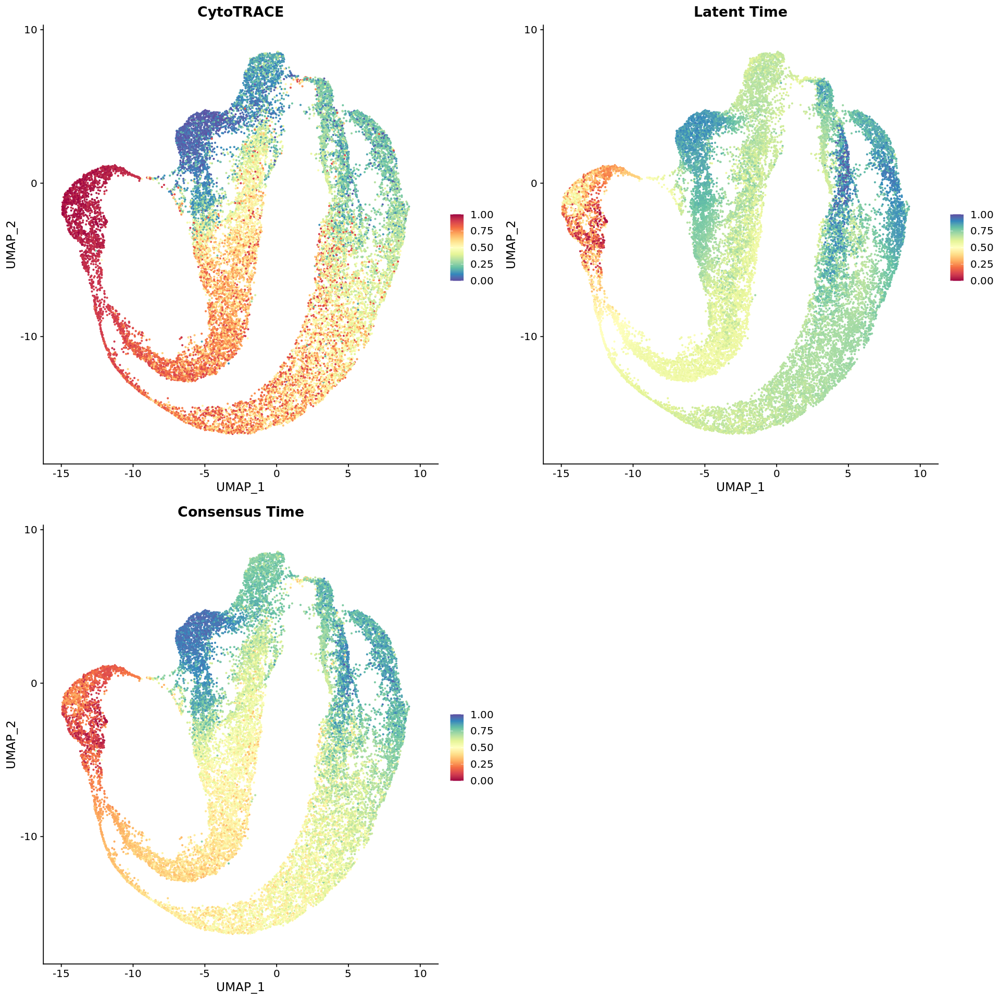

In [13]:
plot_time(end.cor.integrated)

In [14]:
# Correlation among CytoTRACE, latent time and consensus time
res <- cor(data.frame(CytoTRACE=end.cor.integrated$CytoTRACE,latent.time=end.cor.integrated$latenttime,consensus.time=end.cor.integrated$consensus.time))
round(res, 2)

,CytoTRACE,latent.time,consensus.time
CytoTRACE,1.00,-0.72,-0.96
latent.time,-0.72,1.00,0.87
consensus.time,-0.96,0.87,1.00


In [15]:
# Save Seurat object
saveRDS(end.cor.integrated,'./supp_data/Ground_Tissue_Atlas.rds')

## 2. Epidermis + LRC

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



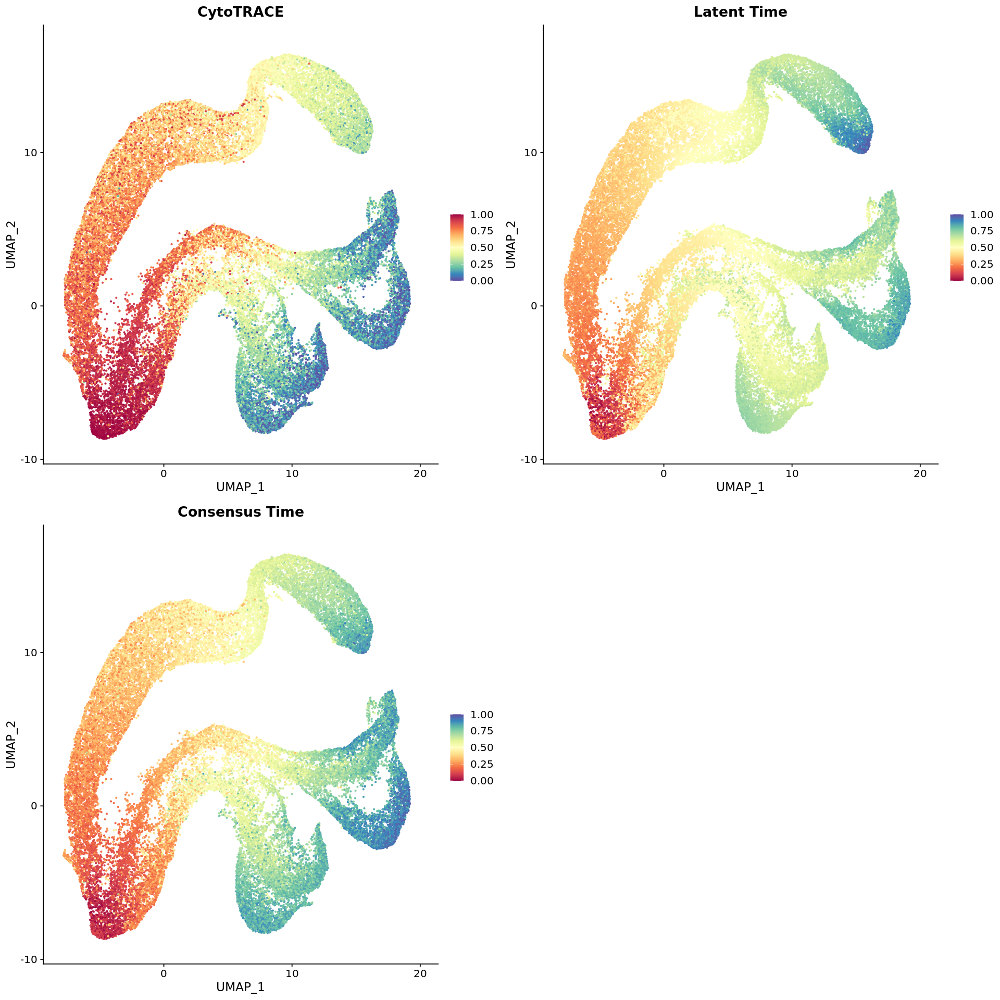

In [23]:
latent.time <- as.numeric(read.table("./supp_data/Epidermis_LRC_Atlas_latent_time.txt", header=F)$V1)
epi.integrated$latenttime <- latent.time

consensus.time <- range01((-(epi.integrated$CytoTRACE-1)+epi.integrated$latenttime)/2)
epi.integrated$consensus.time <- consensus.time

plot_time(epi.integrated)

In [24]:
res <- cor(data.frame(CytoTRACE=epi.integrated$CytoTRACE,latent.time=epi.integrated$latenttime,consensus.time=epi.integrated$consensus.time))
round(res, 2)

,CytoTRACE,latent.time,consensus.time
CytoTRACE,1.00,-0.82,-0.97
latent.time,-0.82,1.00,0.93
consensus.time,-0.97,0.93,1.00


In [26]:
saveRDS(epi.integrated,'./supp_data/Epidermis_LRC_Atlas.rds')

## 3. Columella

In [16]:
latent.time <- as.numeric(read.table("./supp_data/Columella_Atlas_latent_time.txt", header=F)$V1)
col.integrated$latenttime <- latent.time

col.integrated$CytoTRACE[is.na(col.integrated$CytoTRACE)]=0
consensus.time <- range01((-(col.integrated$CytoTRACE-1)+col.integrated$latenttime)/2)
col.integrated$consensus.time <- consensus.time

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



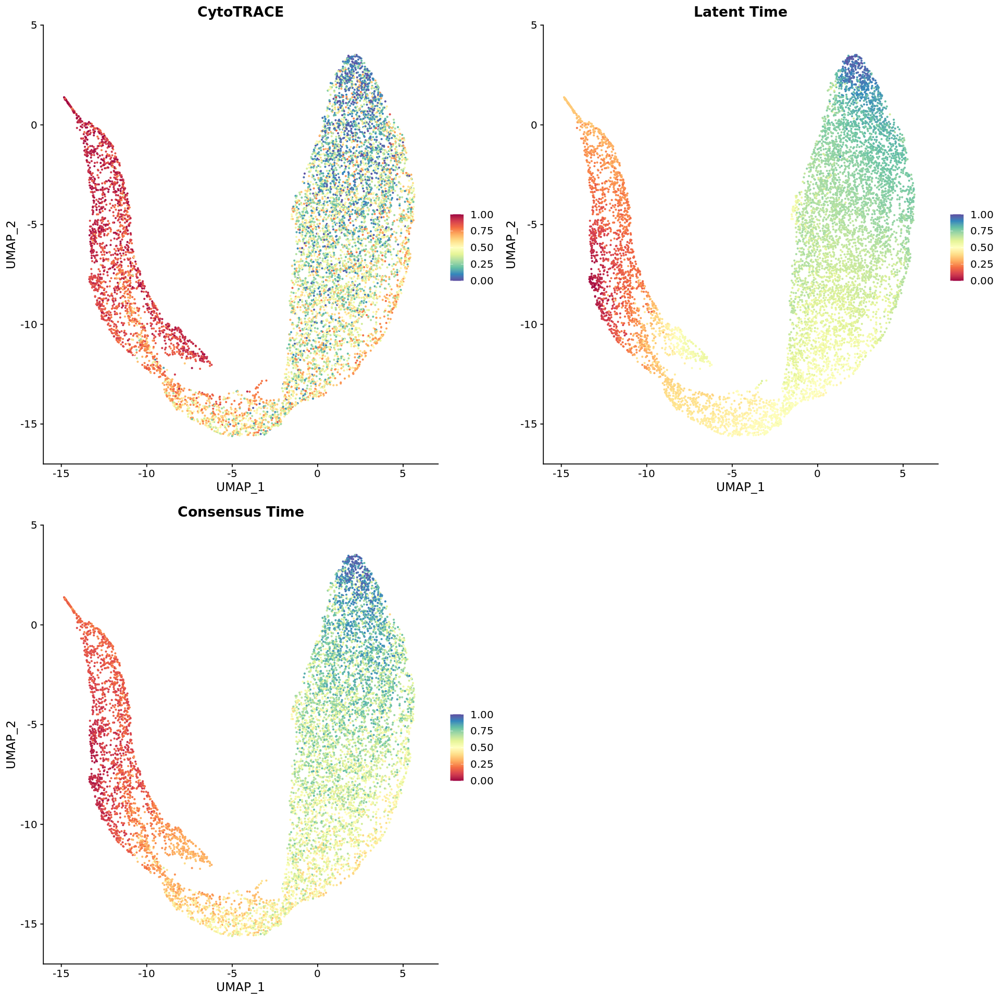

In [20]:
plot_time(col.integrated)

In [21]:
res <- cor(data.frame(CytoTRACE=col.integrated$CytoTRACE,latent.time=col.integrated$latenttime,consensus.time=col.integrated$consensus.time))
round(res, 2)

,CytoTRACE,latent.time,consensus.time
CytoTRACE,1.00,-0.74,-0.95
latent.time,-0.74,1.00,0.91
consensus.time,-0.95,0.91,1.00


In [25]:
saveRDS(col.integrated,'./supp_data/Columella_Atlas.rds')

## 4. Stele

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



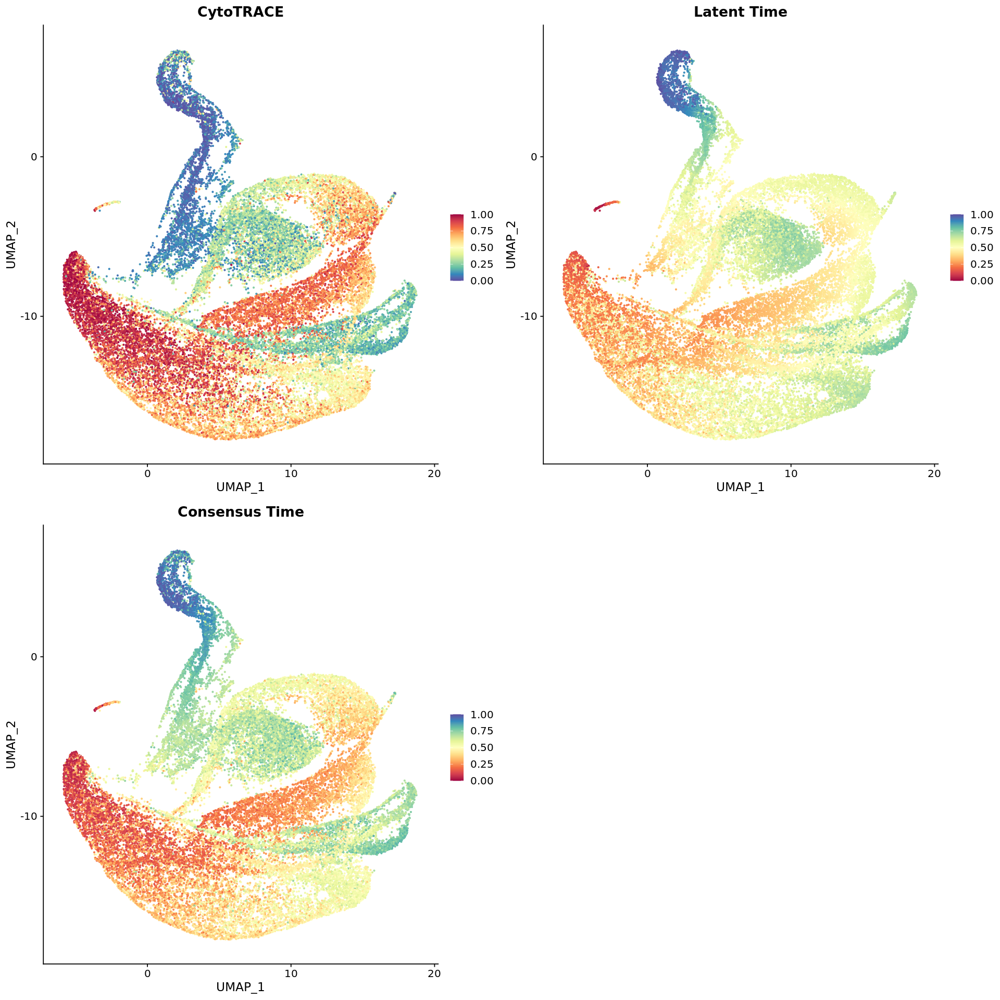

In [27]:
latent.time <- as.numeric(read.table("./supp_data/Stele_Atlas_latent_time.txt", header=F)$V1)
stl.integrated$latenttime <- latent.time

stl.integrated$CytoTRACE[is.na(stl.integrated$CytoTRACE)]=0
stl.integrated$CytoTRACE[which(is.na(stl.integrated$CytoTRACE))] <- stl.integrated$latenttime[which(is.na(stl.integrated$CytoTRACE))]

consensus.time <- range01((-(stl.integrated$CytoTRACE-1)+stl.integrated$latenttime)/2)
stl.integrated$consensus.time <- consensus.time

plot_time(stl.integrated)

In [28]:
res <- cor(data.frame(CytoTRACE=stl.integrated$CytoTRACE,latent.time=stl.integrated$latenttime,consensus.time=stl.integrated$consensus.time))
round(res, 2)

,CytoTRACE,latent.time,consensus.time
CytoTRACE,1.00,-0.67,-0.95
latent.time,-0.67,1.00,0.86
consensus.time,-0.95,0.86,1.00


In [29]:
saveRDS(stl.integrated,'./supp_data/Stele_Atlas.rds')

## 5. Integrate consensus time

In [30]:
# Cell index for each tissue/lineages
end.cor.traj.idx <- which(rc.integrated$celltype.anno == "Endodermis" | rc.integrated$celltype.anno == "Cortex" | rc.integrated$celltype.anno == "Quiescent Center")
epi.traj.idx <- which(rc.integrated$celltype.anno == "Atrichoblast" | rc.integrated$celltype.anno == "Trichoblast" | rc.integrated$celltype.anno == "Lateral Root Cap" | rc.integrated$celltype.anno == "Quiescent Center")
col.traj.idx <- which(rc.integrated$celltype.anno == "Columella" | rc.integrated$celltype.anno == "Quiescent Center")
stl.traj.idx <- which(rc.integrated$celltype.anno == "Xylem Pole Pericycle" | rc.integrated$celltype.anno == "Phloem Pole Pericycle" | rc.integrated$celltype.anno == "Metaxylem" | rc.integrated$celltype.anno == "Protoxylem" | rc.integrated$celltype.anno == "Procambium" | rc.integrated$celltype.anno == "Quiescent Center"| rc.integrated$celltype.anno == "Metaphloem & Companion Cell"| rc.integrated$celltype.anno == "Protophloem")
scn.traj.idx <- which(rc.integrated$celltype.anno == "Quiescent Center")

In [31]:
# Combine consensus time
t1 <- rep(0,ncol(rc.integrated))
t2 <- rep(0,ncol(rc.integrated))
t3 <- rep(0,ncol(rc.integrated))
t4 <- rep(0,ncol(rc.integrated))
t1[end.cor.traj.idx] <- end.cor.integrated$consensus.time
t2[epi.traj.idx] <- epi.integrated$consensus.time
t3[col.traj.idx] <- col.integrated$consensus.time
t4[stl.traj.idx] <- stl.integrated$consensus.time

In [32]:
consensus.time <- t1+t2+t3+t4

In [33]:
# Take average of SCN and QC cells
consensus.time[scn.traj.idx] <- consensus.time[scn.traj.idx]/4

In [34]:
# Store final results of consensus time
rc.integrated$consensus.time <- consensus.time

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



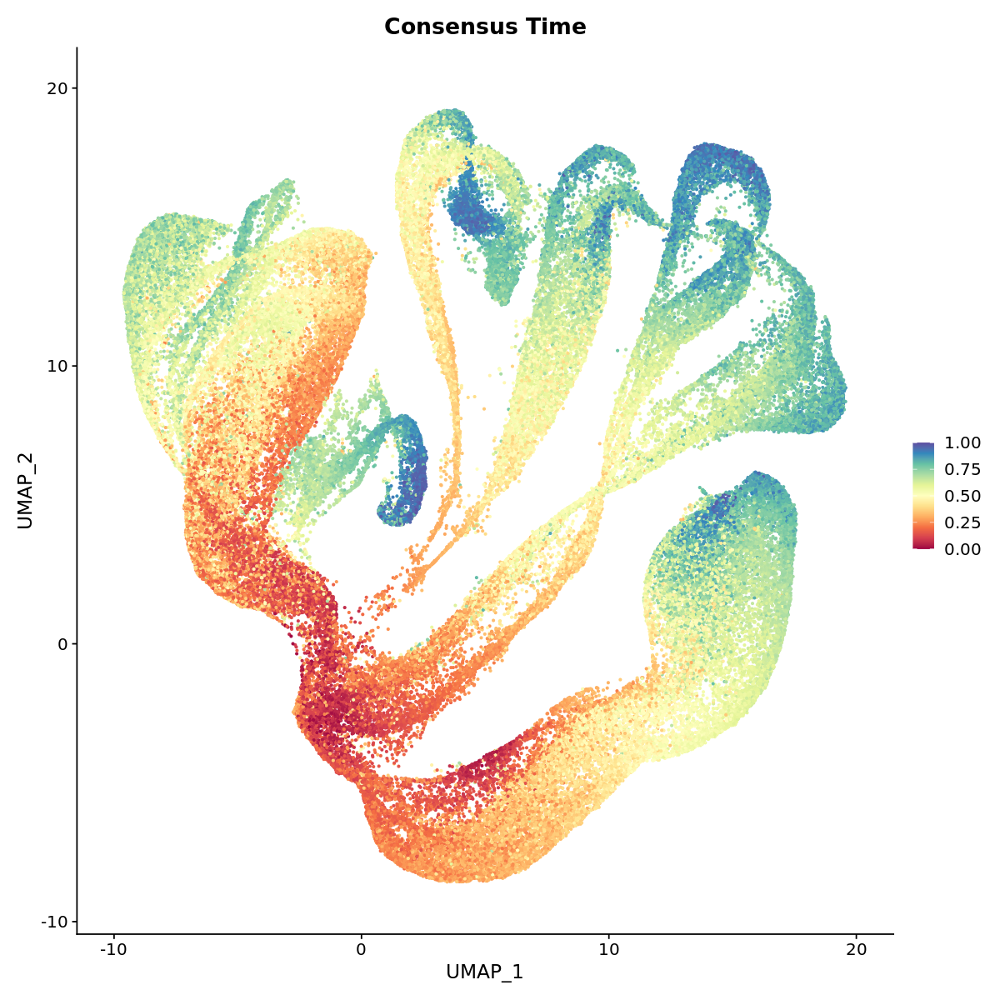

In [35]:
# Plot consensus time
options(repr.plot.width=10, repr.plot.height=10)
FeaturePlot(rc.integrated, features = "consensus.time", pt.size=0.5)+ scale_colour_gradientn(colours = brewer.pal(11,"Spectral"))+ggtitle("Consensus Time")

In [36]:
# Divide cells into ten groups of even size based on consensus time
d <- round(ncol(rc.integrated)/10);
d
names(consensus.time) <- seq(1,ncol(rc.integrated),1)
consensus.time.group <- rep("Unknown",ncol(rc.integrated))
consensus.time.group[as.numeric(names(sort(consensus.time)[1:d]))] = "T0"
consensus.time.group[as.numeric(names(sort(consensus.time)[(d+1):(2*d)]))] = "T1"
consensus.time.group[as.numeric(names(sort(consensus.time)[(2*d+1):(3*d)]))] = "T2"
consensus.time.group[as.numeric(names(sort(consensus.time)[(3*d+1):(4*d)]))] = "T3"
consensus.time.group[as.numeric(names(sort(consensus.time)[(4*d+1):(5*d)]))] = "T4"
consensus.time.group[as.numeric(names(sort(consensus.time)[(5*d+1):(6*d)]))] = "T5"
consensus.time.group[as.numeric(names(sort(consensus.time)[(6*d+1):(7*d)]))] = "T6"
consensus.time.group[as.numeric(names(sort(consensus.time)[(7*d+1):(8*d)]))] = "T7"
consensus.time.group[as.numeric(names(sort(consensus.time)[(8*d+1):(9*d)]))] = "T8"
consensus.time.group[as.numeric(names(sort(consensus.time)[(9*d+1):ncol(rc.integrated)]))] = "T9"

[1] 11043

In [37]:
table(consensus.time.group)

consensus.time.group
   T0    T1    T2    T3    T4    T5    T6    T7    T8    T9 
11043 11043 11043 11043 11043 11043 11043 11043 11043 11040 

In [38]:
# Store consensus time group
rc.integrated$consensus.time.group <- consensus.time.group

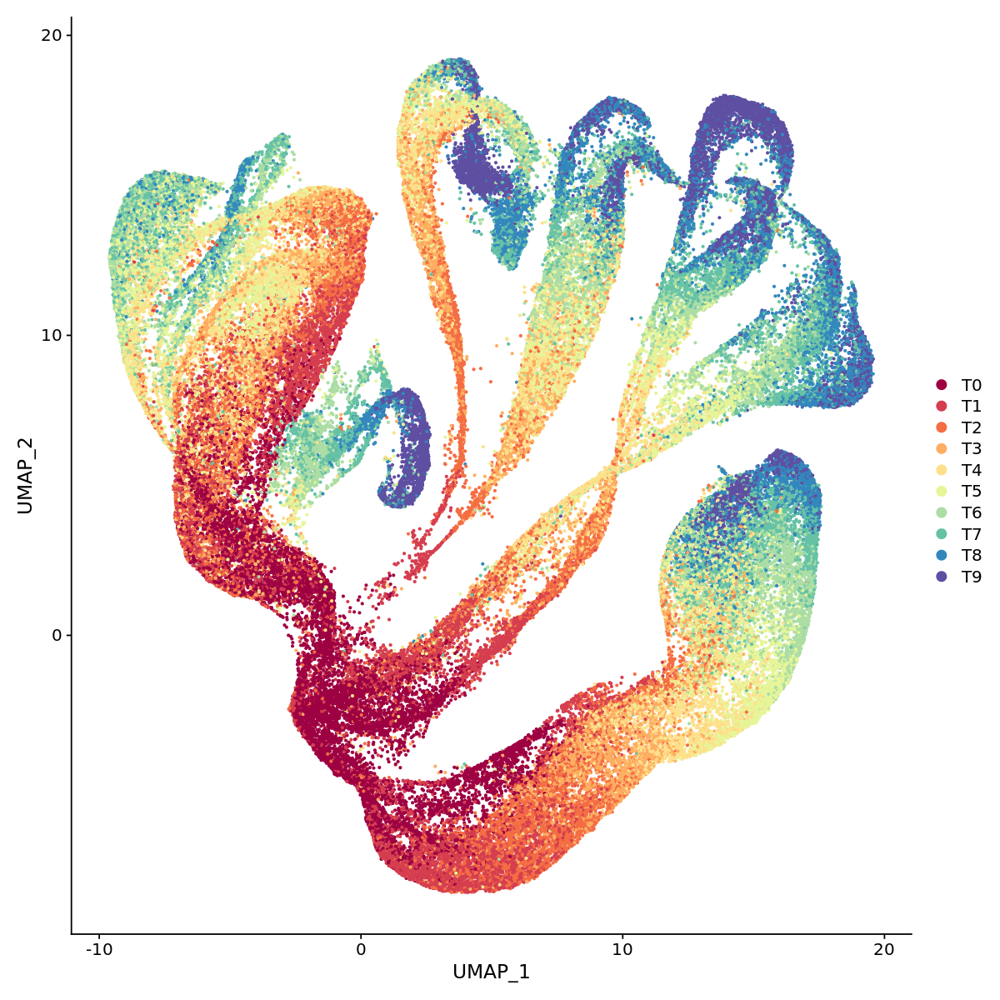

In [39]:
# Plot consensus time group
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(rc.integrated, reduction = "umap", group.by = "consensus.time.group", pt.size=0.5, cols=brewer.pal(10,"Spectral"))

In [40]:
# Divide cells into ten groups of even size based on consensus time
d <- round(ncol(rc.integrated)/50);
d
names(consensus.time) <- seq(1,ncol(rc.integrated),1)
consensus.time.group <- rep("Unknown",ncol(rc.integrated))
consensus.time.group[as.numeric(names(sort(consensus.time)[1:d]))] = "T0"
consensus.time.group[as.numeric(names(sort(consensus.time)[(d+1):(2*d)]))] = "T1"
consensus.time.group[as.numeric(names(sort(consensus.time)[(2*d+1):(3*d)]))] = "T2"
consensus.time.group[as.numeric(names(sort(consensus.time)[(3*d+1):(4*d)]))] = "T3"
consensus.time.group[as.numeric(names(sort(consensus.time)[(4*d+1):(5*d)]))] = "T4"
consensus.time.group[as.numeric(names(sort(consensus.time)[(5*d+1):(6*d)]))] = "T5"
consensus.time.group[as.numeric(names(sort(consensus.time)[(6*d+1):(7*d)]))] = "T6"
consensus.time.group[as.numeric(names(sort(consensus.time)[(7*d+1):(8*d)]))] = "T7"
consensus.time.group[as.numeric(names(sort(consensus.time)[(8*d+1):(9*d)]))] = "T8"
consensus.time.group[as.numeric(names(sort(consensus.time)[(9*d+1):(10*d)]))] = "T9"
consensus.time.group[as.numeric(names(sort(consensus.time)[(10*d+1):(11*d)]))] = "T10"
consensus.time.group[as.numeric(names(sort(consensus.time)[(11*d+1):(12*d)]))] = "T11"
consensus.time.group[as.numeric(names(sort(consensus.time)[(12*d+1):(13*d)]))] = "T12"
consensus.time.group[as.numeric(names(sort(consensus.time)[(13*d+1):(14*d)]))] = "T13"
consensus.time.group[as.numeric(names(sort(consensus.time)[(14*d+1):(15*d)]))] = "T14"
consensus.time.group[as.numeric(names(sort(consensus.time)[(15*d+1):(16*d)]))] = "T15"
consensus.time.group[as.numeric(names(sort(consensus.time)[(16*d+1):(17*d)]))] = "T16"
consensus.time.group[as.numeric(names(sort(consensus.time)[(17*d+1):(18*d)]))] = "T17"
consensus.time.group[as.numeric(names(sort(consensus.time)[(18*d+1):(19*d)]))] = "T18"
consensus.time.group[as.numeric(names(sort(consensus.time)[(19*d+1):(20*d)]))] = "T19"
consensus.time.group[as.numeric(names(sort(consensus.time)[(20*d+1):(21*d)]))] = "T20"
consensus.time.group[as.numeric(names(sort(consensus.time)[(21*d+1):(22*d)]))] = "T21"
consensus.time.group[as.numeric(names(sort(consensus.time)[(22*d+1):(23*d)]))] = "T22"
consensus.time.group[as.numeric(names(sort(consensus.time)[(23*d+1):(24*d)]))] = "T23"
consensus.time.group[as.numeric(names(sort(consensus.time)[(24*d+1):(25*d)]))] = "T24"
consensus.time.group[as.numeric(names(sort(consensus.time)[(25*d+1):(26*d)]))] = "T25"
consensus.time.group[as.numeric(names(sort(consensus.time)[(26*d+1):(27*d)]))] = "T26"
consensus.time.group[as.numeric(names(sort(consensus.time)[(27*d+1):(28*d)]))] = "T27"
consensus.time.group[as.numeric(names(sort(consensus.time)[(28*d+1):(29*d)]))] = "T28"
consensus.time.group[as.numeric(names(sort(consensus.time)[(29*d+1):(30*d)]))] = "T29"
consensus.time.group[as.numeric(names(sort(consensus.time)[(30*d+1):(31*d)]))] = "T30"
consensus.time.group[as.numeric(names(sort(consensus.time)[(31*d+1):(32*d)]))] = "T31"
consensus.time.group[as.numeric(names(sort(consensus.time)[(32*d+1):(33*d)]))] = "T32"
consensus.time.group[as.numeric(names(sort(consensus.time)[(33*d+1):(34*d)]))] = "T33"
consensus.time.group[as.numeric(names(sort(consensus.time)[(34*d+1):(35*d)]))] = "T34"
consensus.time.group[as.numeric(names(sort(consensus.time)[(35*d+1):(36*d)]))] = "T35"
consensus.time.group[as.numeric(names(sort(consensus.time)[(36*d+1):(37*d)]))] = "T36"
consensus.time.group[as.numeric(names(sort(consensus.time)[(37*d+1):(38*d)]))] = "T37"
consensus.time.group[as.numeric(names(sort(consensus.time)[(38*d+1):(39*d)]))] = "T38"
consensus.time.group[as.numeric(names(sort(consensus.time)[(39*d+1):(40*d)]))] = "T39"
consensus.time.group[as.numeric(names(sort(consensus.time)[(40*d+1):(41*d)]))] = "T40"
consensus.time.group[as.numeric(names(sort(consensus.time)[(41*d+1):(42*d)]))] = "T41"
consensus.time.group[as.numeric(names(sort(consensus.time)[(42*d+1):(43*d)]))] = "T42"
consensus.time.group[as.numeric(names(sort(consensus.time)[(43*d+1):(44*d)]))] = "T43"
consensus.time.group[as.numeric(names(sort(consensus.time)[(44*d+1):(45*d)]))] = "T44"
consensus.time.group[as.numeric(names(sort(consensus.time)[(45*d+1):(46*d)]))] = "T45"
consensus.time.group[as.numeric(names(sort(consensus.time)[(46*d+1):(47*d)]))] = "T46"
consensus.time.group[as.numeric(names(sort(consensus.time)[(47*d+1):(48*d)]))] = "T47"
consensus.time.group[as.numeric(names(sort(consensus.time)[(48*d+1):(49*d)]))] = "T48"
consensus.time.group[as.numeric(names(sort(consensus.time)[(49*d+1):ncol(rc.integrated)]))] = "T49"

[1] 2209

In [41]:
table(consensus.time.group)

consensus.time.group
  T0   T1  T10  T11  T12  T13  T14  T15  T16  T17  T18  T19   T2  T20  T21  T22 
2209 2209 2209 2209 2209 2209 2209 2209 2209 2209 2209 2209 2209 2209 2209 2209 
 T23  T24  T25  T26  T27  T28  T29   T3  T30  T31  T32  T33  T34  T35  T36  T37 
2209 2209 2209 2209 2209 2209 2209 2209 2209 2209 2209 2209 2209 2209 2209 2209 
 T38  T39   T4  T40  T41  T42  T43  T44  T45  T46  T47  T48  T49   T5   T6   T7 
2209 2209 2209 2209 2209 2209 2209 2209 2209 2209 2209 2209 2186 2209 2209 2209 
  T8   T9 
2209 2209 

In [42]:
# Store consensus time group
rc.integrated$consensus.time.group.50 <- consensus.time.group

In [52]:
saveRDS(rc.integrated,'./supp_data/Root_Atlas.rds')

## 6. Transfer consensus time group to extracted tissue

In [46]:
end.cor.integrated$consensus.time.group <- rc.integrated$consensus.time.group[end.cor.traj.idx];
epi.integrated$consensus.time.group <- rc.integrated$consensus.time.group[epi.traj.idx];
col.integrated$consensus.time.group <- rc.integrated$consensus.time.group[col.traj.idx];
stl.integrated$consensus.time.group <- rc.integrated$consensus.time.group[stl.traj.idx];
end.cor.integrated$consensus.time.group.50 <- rc.integrated$consensus.time.group.50[end.cor.traj.idx];
epi.integrated$consensus.time.group.50 <- rc.integrated$consensus.time.group.50[epi.traj.idx];
col.integrated$consensus.time.group.50 <- rc.integrated$consensus.time.group.50[col.traj.idx];
stl.integrated$consensus.time.group.50 <- rc.integrated$consensus.time.group.50[stl.traj.idx];

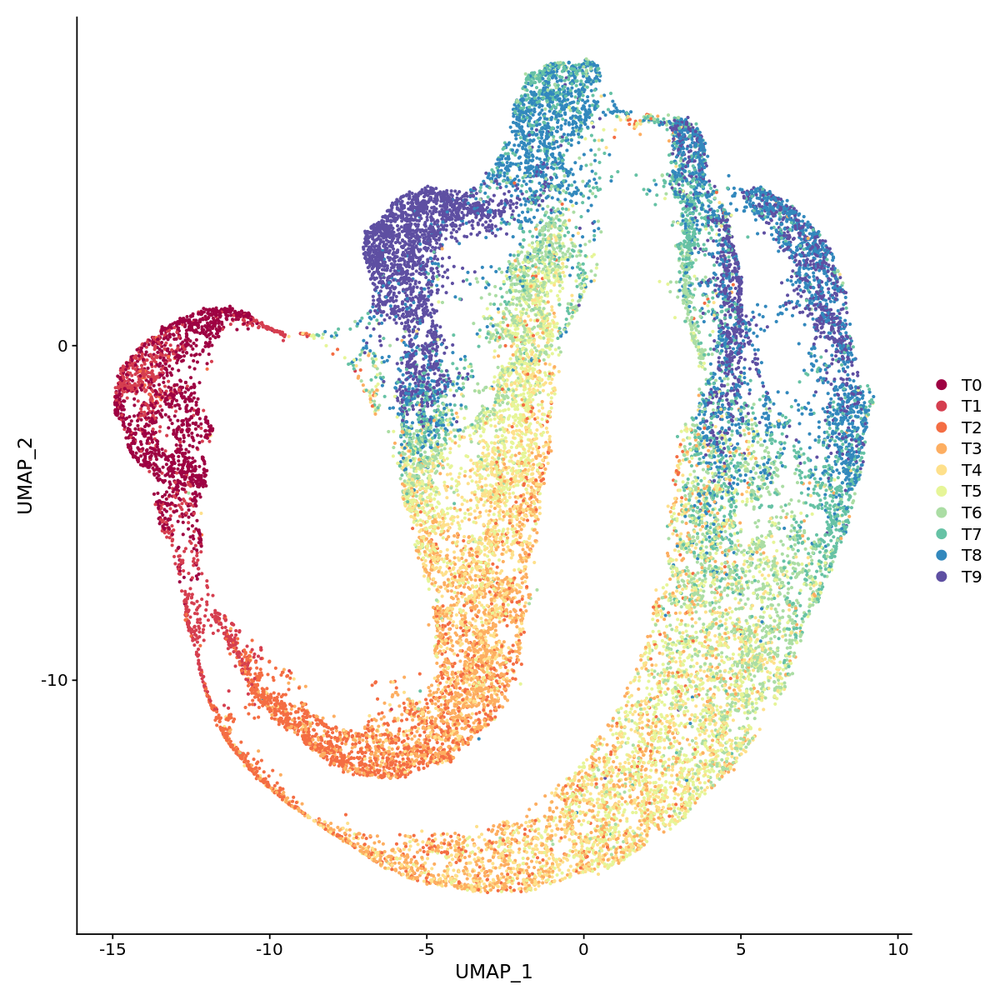

In [47]:
# Plot consensus time group for ground tissue
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(end.cor.integrated, reduction = "umap", group.by = "consensus.time.group", pt.size=0.5, cols=brewer.pal(10,"Spectral"))

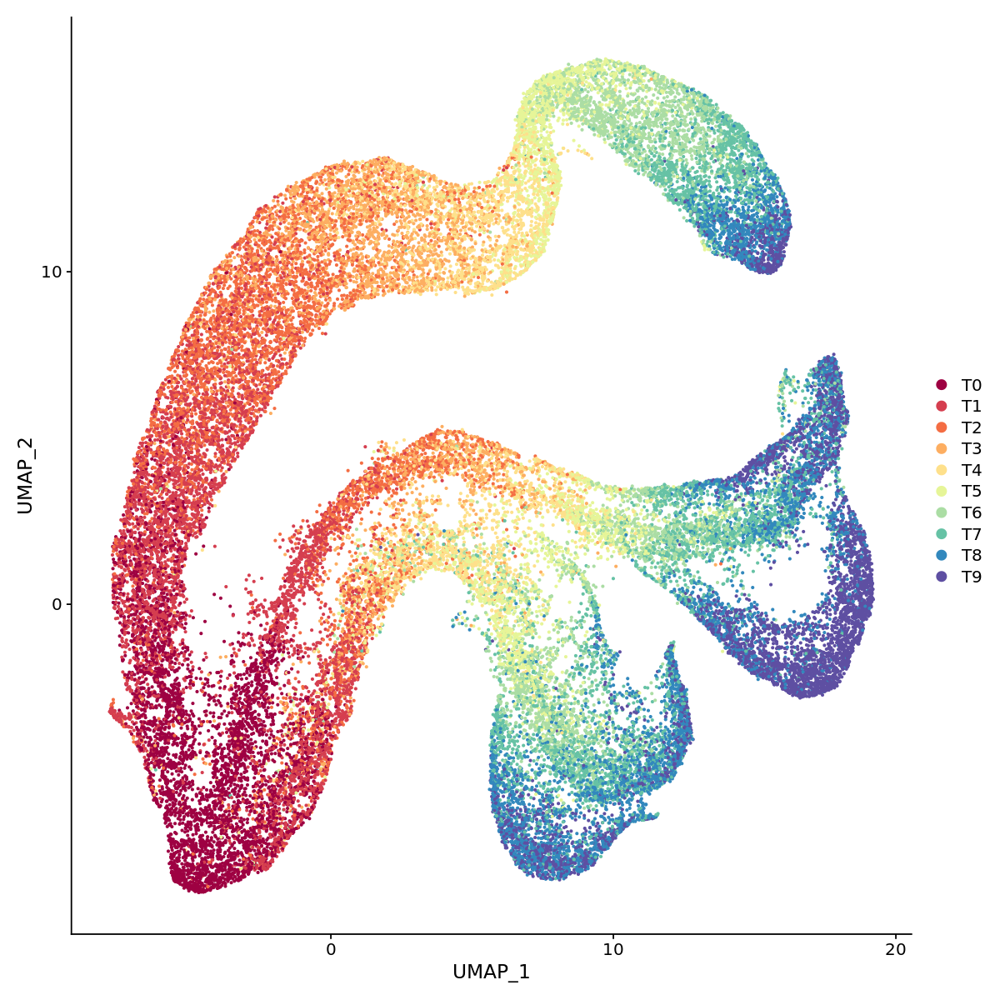

In [49]:
# Plot consensus time group for epidermis and LRC
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(epi.integrated, reduction = "umap", group.by = "consensus.time.group", pt.size=0.5, cols=brewer.pal(10,"Spectral"))

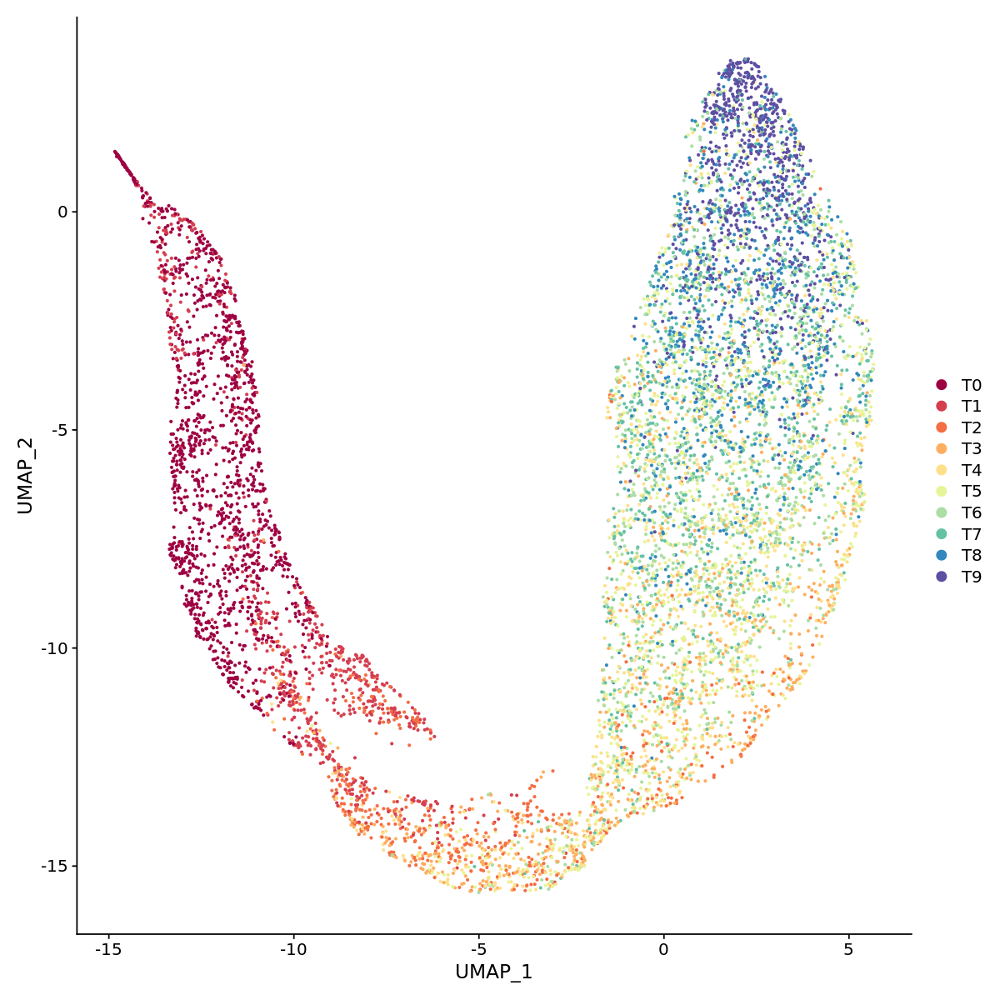

In [50]:
# Plot consensus time group for columella
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(col.integrated, reduction = "umap", group.by = "consensus.time.group", pt.size=0.5, cols=brewer.pal(10,"Spectral"))

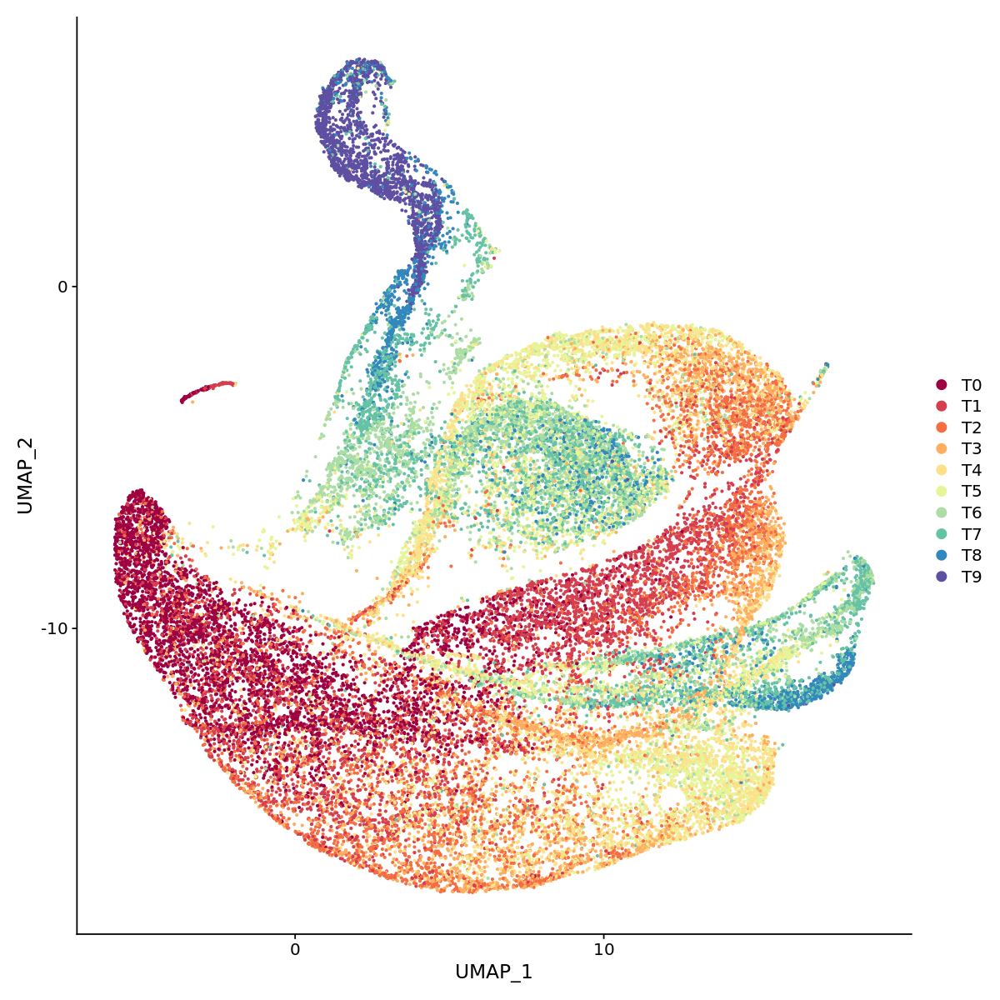

In [51]:
# Plot consensus time group for stele
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(stl.integrated, reduction = "umap", group.by = "consensus.time.group", pt.size=0.5, cols=brewer.pal(10,"Spectral"))

In [53]:
saveRDS(end.cor.integrated, './supp_data/Ground_Tissue_Atlas.rds')
saveRDS(epi.integrated, './supp_data/Epidermis_LRC_Atlas.rds')
saveRDS(col.integrated, './supp_data/Columella_Atlas.rds')
saveRDS(stl.integrated, './supp_data/Stele_Atlas.rds')